In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import lightgbm as lgb
import gc
import scipy.signal as signal
import scipy.stats as stats
import time
import warnings
from collections import OrderedDict

warnings.filterwarnings('ignore')
pd.set_option("max_columns", 200)
pd.set_option("max_rows", 200)
gc.enable()
colors = ["#849db1", "#a2ceaa", "#638b66", "#bfbb60", "#f47942", "#fbb04e", "#b66353", "#d7ce9f", "#b9aa97", 
          "#7e756d", "#4E79A7", "#A0CBE8", "#F28E2B", "#FFBE7D", "#59A14F", "#8CD17D", "#B6992D", "#F1CE63", 
          "#499894", "#86BCB6", "#E15759", "#FF9D9A", "#79706E", "#BAB0AC", "#D37295", "#FABFD2", "#B07AA1", 
          "#D4A6C8", "#9D7660", "#D7B5A6"]*3

/usr/local/lib/python3.7/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.1) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [2]:
# Reading the data

x_train = pd.read_csv('../input/X_train.csv')
y_train = pd.read_csv('../input/y_train.csv')
x_test = pd.read_csv('../input/X_test.csv')

In [3]:
# Size of x_train in megabytes
x_train.memory_usage().sum()/1024/1024

48.36921691894531

In [4]:
print(x_train.shape)
x_train.head()

(487680, 13)


,row_id,series_id,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W,angular_velocity_X,angular_velocity_Y,angular_velocity_Z,linear_acceleration_X,linear_acceleration_Y,linear_acceleration_Z
0,0_0,0,0,-0.75853,-0.63435,-0.10488,-0.10597,0.107650,0.017561,0.000767,-0.74857,2.1030,-9.7532
1,0_1,0,1,-0.75853,-0.63434,-0.10490,-0.10600,0.067851,0.029939,0.003385,0.33995,1.5064,-9.4128
2,0_2,0,2,-0.75853,-0.63435,-0.10492,-0.10597,0.007275,0.028934,-0.005978,-0.26429,1.5922,-8.7267
3,0_3,0,3,-0.75852,-0.63436,-0.10495,-0.10597,-0.013053,0.019448,-0.008974,0.42684,1.0993,-10.0960
4,0_4,0,4,-0.75852,-0.63435,-0.10495,-0.10596,0.005135,0.007652,0.005245,-0.50969,1.4689,-10.4410


In [5]:
print(y_train.shape)
y_train.head()

(3810, 3)


,series_id,group_id,surface
0,0,13,fine_concrete
1,1,31,concrete
2,2,20,concrete
3,3,31,concrete
4,4,22,soft_tiles


In [157]:
x_train.describe()

,series_id,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W,angular_velocity_X,angular_velocity_Y,angular_velocity_Z,linear_acceleration_X,linear_acceleration_Y,linear_acceleration_Z
count,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000
mean,1904.500000,63.500000,-0.018050,0.075062,0.012458,-0.003804,0.000178,0.008338,-0.019184,0.129281,2.886468,-9.364886
std,1099.853353,36.949327,0.685696,0.708226,0.105972,0.104299,0.117764,0.088677,0.229153,1.870600,2.140067,2.845341
min,0.000000,0.000000,-0.989100,-0.989650,-0.162830,-0.156620,-2.371000,-0.927860,-1.268800,-36.067000,-121.490000,-75.386000
25%,952.000000,31.750000,-0.705120,-0.688980,-0.089466,-0.106060,-0.040752,-0.033191,-0.090743,-0.530833,1.957900,-10.193000
50%,1904.500000,63.500000,-0.105960,0.237855,0.031949,-0.018704,0.000084,0.005412,-0.005335,0.124980,2.879600,-9.365300
75%,2857.000000,95.250000,0.651803,0.809550,0.122870,0.097215,0.040527,0.048068,0.064604,0.792263,3.798800,-8.522700
max,3809.000000,127.000000,0.989100,0.988980,0.155710,0.154770,2.282200,1.079100,1.387300,36.797000,73.008000,65.839000


In [158]:
x_train.groupby('series_id').describe()

angular_velocity_X                                          \
                       count      mean       std       min       25%   
series_id                                                              
0                      128.0 -0.002481  0.052800 -0.160410 -0.029069   
1                      128.0  0.004605  0.092309 -0.254800 -0.055216   
2                      128.0  0.002646  0.060168 -0.152710 -0.045363   
3                      128.0  0.000624  0.179544 -0.401520 -0.115605   
4                      128.0  0.006969  0.044773 -0.104070 -0.024632   
5                      128.0 -0.007366  0.098252 -0.197080 -0.085415   
6                      128.0  0.010419  0.025530 -0.053589 -0.004154   
7                      128.0  0.009183  0.128806 -0.364700 -0.084953   
8                      128.0 -0.005301  0.015145 -0.042677 -0.018298   
9                      128.0 -0.007559  0.083914 -0.204750 -0.062952   
10                     128.0 -0.000087  0.048430 -0.116430 -0.033517   
11                     128.0  0.009737  0.163026 -0.328480 -0.110180   
12                     128.0  0.002228  0.106113 -0.259190 -0.065629   
13                     128.0 -0.000462  0.053344 -0.113080 -0.036859   
14                     128.0  0.000478  0.307653 -0.737150 -0.183600   
15                     128.0  0.013917  0.098230 -0.181460 -0.050763   
16                     128.0  0.000870  0.217779 -0.452650 -0.176110   
17                     128.0  0.001546  0.035114 -0.066930 -0.032221   
18                     128.0  0.029347  0.184760 -0.407880 -0.092702   
19                     128.0  0.004258  0.017182 -0.037375 -0.006245   
20                     128.0 -0.000103  0.064982 -0.140100 -0.046378   
21                     128.0  0.000206  0.005018 -0.011030 -0.003132   
22                     128.0  0.000364  0.004271 -0.011851 -0.001853   
23                     128.0  0.010523  0.098140 -0.189590 -0.058526   
24                     128.0  0.001398  0.010986 -0.023979 -0.006310   
25                     128.0 -0.001939  0.017800 -0.046478 -0.013106   
26                     128.0 -0.002667  0.021271 -0.052799 -0.016317   
27                     128.0 -0.003963  0.027803 -0.076970 -0.020161   
28                     128.0 -0.004352  0.104655 -0.306790 -0.065822   
29                     128.0 -0.000120  0.036001 -0.096391 -0.019558   
30                     128.0  0.004331  0.015005 -0.039396 -0.005999   
31                     128.0  0.003896  0.016365 -0.034730 -0.008557   
32                     128.0 -0.010945  0.060414 -0.158160 -0.052112   
33                     128.0 -0.001601  0.134499 -0.330550 -0.078161   
34                     128.0  0.009270  0.037565 -0.069919 -0.015645   
35                     128.0 -0.012493  0.121608 -0.362360 -0.086261   
36                     128.0 -0.005809  0.103824 -0.311650 -0.067973   
37                     128.0 -0.012935  0.285827 -0.707880 -0.206412   
38                     128.0 -0.002366  0.026026 -0.052845 -0.024555   
39                     128.0  0.002347  0.151799 -0.360350 -0.106680   
40                     128.0 -0.004086  0.059638 -0.152490 -0.041673   
41                     128.0  0.004252  0.109771 -0.266640 -0.071112   
42                     128.0  0.007521  0.069095 -0.180370 -0.030274   
43                     128.0 -0.000007  0.002820 -0.006408 -0.002151   
44                     128.0  0.003681  0.024534 -0.058390 -0.011772   
45                     128.0  0.004347  0.042257 -0.084437 -0.026023   
46                     128.0 -0.004472  0.063593 -0.185720 -0.043374   
47                     128.0 -0.000366  0.003967 -0.010255 -0.003199   
48                     128.0 -0.008232  0.152396 -0.307930 -0.107445   
49                     128.0  0.003743  0.062309 -0.160840 -0.033242   
50                     128.0  0.009465  0.112314 -0.349010 -0.069507   
51                     128.0  0.006125  0.015456 -0.030242 -0.003257   
52                     128.0 -0.001088  0.017104 -

# Correlation Matrix

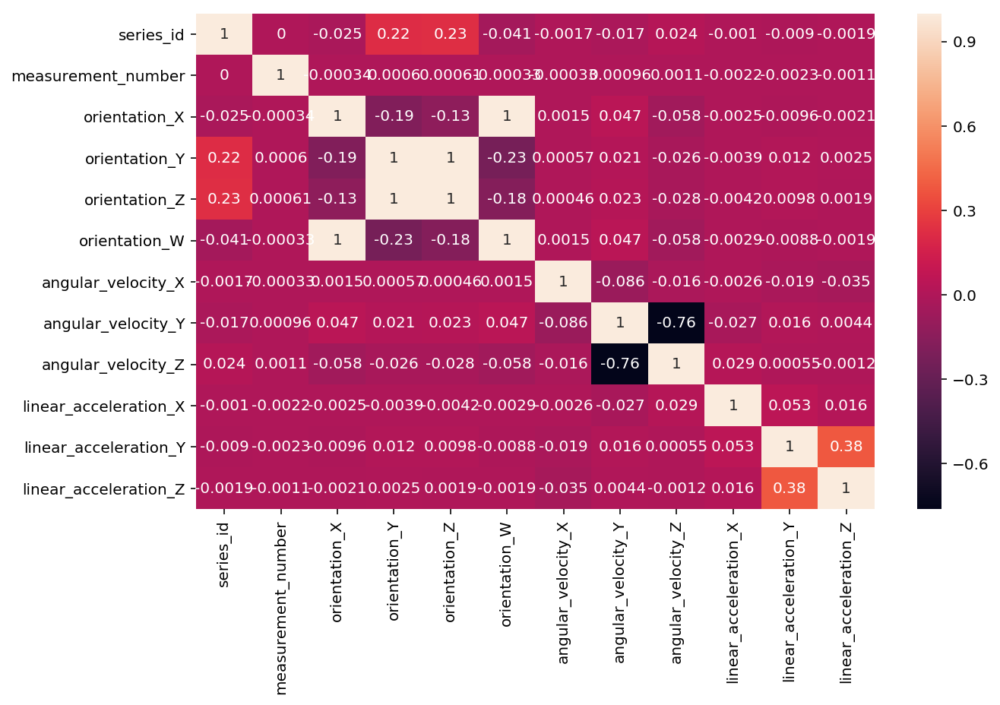

In [159]:
fig, ax = plt.subplots(figsize=(10,6))
sns.heatmap(x_train.corr(), annot=True, ax=ax);

- Very high positive correlation between `Orientation_X` and `Orientation_W`
- Very high positive correlation between `Orientation_Y` and `Orientation_Z`
- Significant positive correlation between `linear_acceleration_Y` and `linear_acceleration_Z`
- High negative correlation between `angular_velocity_Y` and `angular_velocity_Z`

# Distribution of Orientation Variables

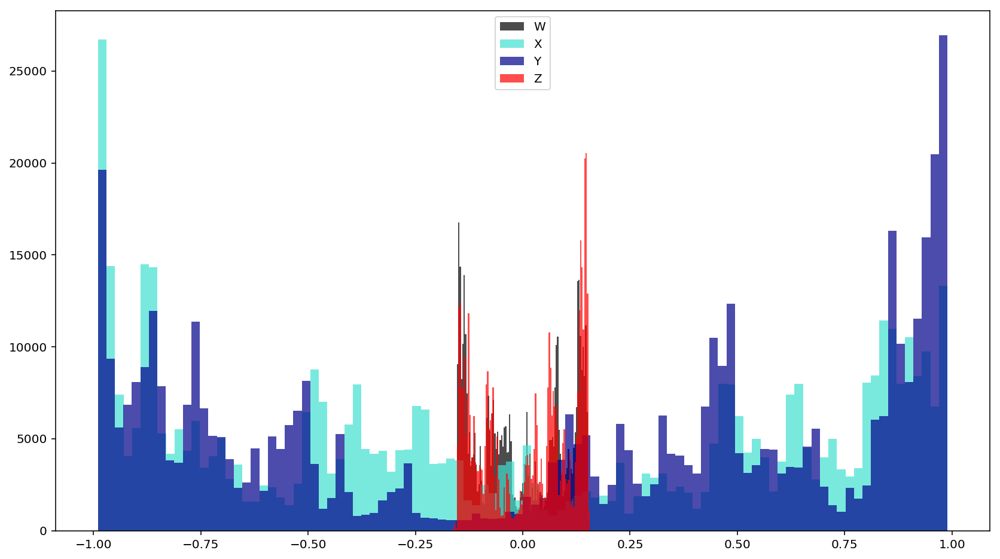

In [160]:
plt.figure(figsize=(14,8))
bins=100
alpha= 0.7
plt.hist(x_train['orientation_W'], color='black', alpha=alpha, bins=bins, label='W');
plt.hist(x_train['orientation_X'], color='Turquoise', alpha=alpha, bins=bins, label='X');
plt.hist(x_train['orientation_Y'], color='darkblue', alpha=alpha, bins=bins, label='Y');
plt.hist(x_train['orientation_Z'], color='red', alpha=alpha, bins=bins, label='Z');
plt.legend();

# Distribution of Angular-Velocity Variables

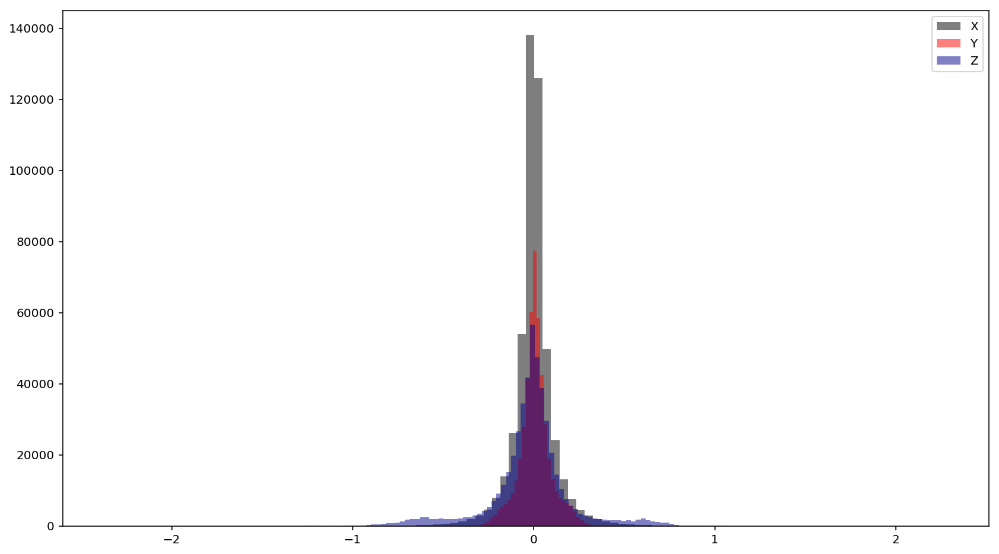

In [161]:
plt.figure(figsize=(14,8))
bins=100
alpha= 0.5
plt.hist(x_train['angular_velocity_X'], color='black', alpha=alpha, bins=bins, label='X');
plt.hist(x_train['angular_velocity_Y'], color='red', alpha=alpha, bins=bins, label='Y');
plt.hist(x_train['angular_velocity_Z'], color='darkblue', alpha=alpha, bins=bins, label='Z');
plt.legend();

# Distributio of Linear-Acceleration Variables

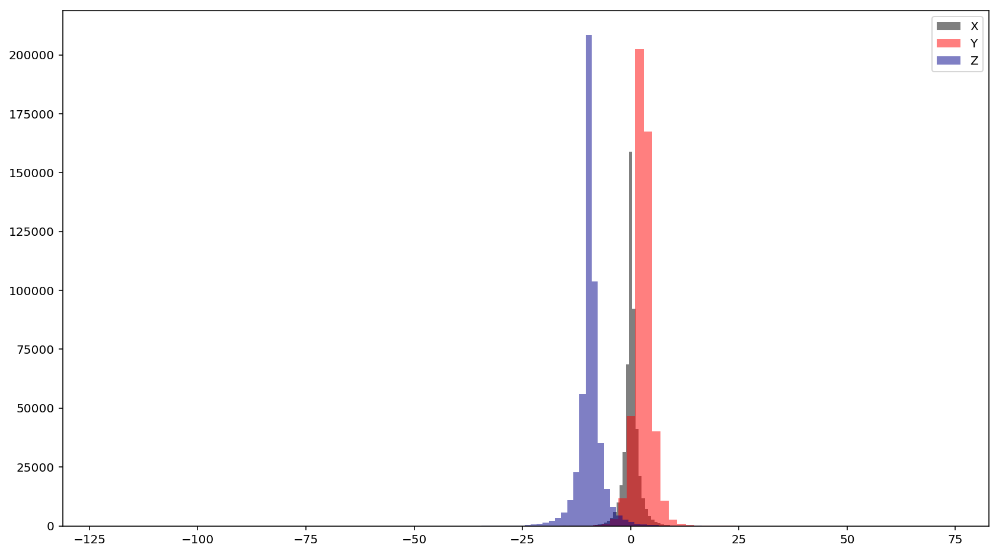

In [162]:
plt.figure(figsize=(14,8))
bins=100
alpha= 0.5
plt.hist(x_train['linear_acceleration_X'], color='black', alpha=alpha, bins=bins, label='X');
plt.hist(x_train['linear_acceleration_Y'], color='red', alpha=alpha, bins=bins, label='Y');
plt.hist(x_train['linear_acceleration_Z'], color='darkblue', alpha=alpha, bins=bins, label='Z');
plt.legend();

# Orientation Variables Plotted for 100 Series

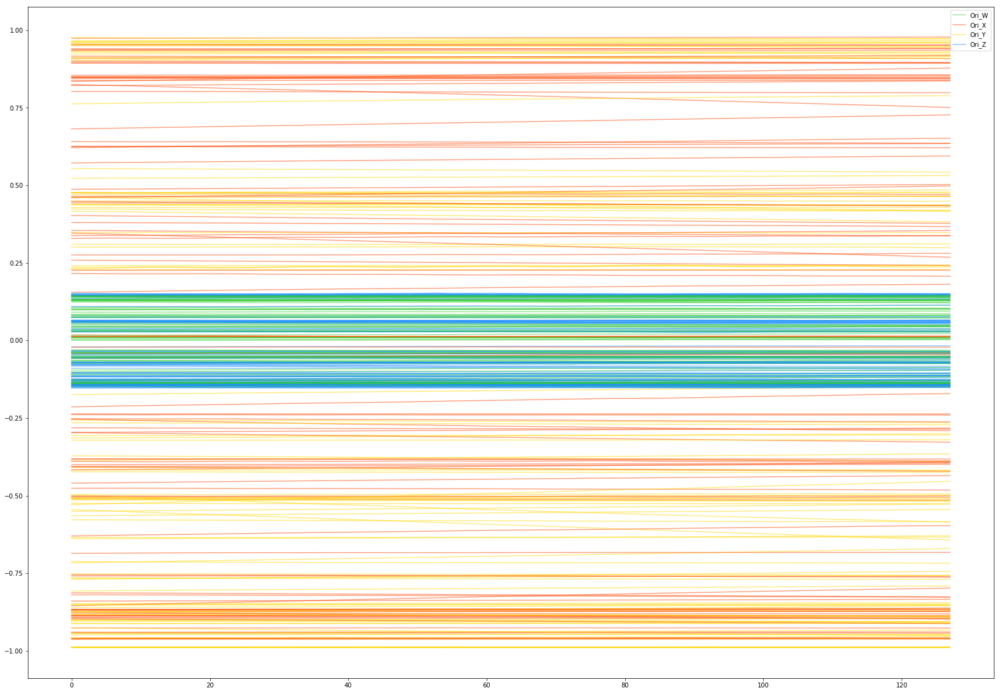

In [66]:
plt.figure(figsize=(28,20));
for i in range(100):
    cdf = x_train[x_train['series_id'] == i].reset_index(drop=True)
    alpha = 0.5
    plt.plot(cdf['orientation_W'], color='limegreen', alpha=alpha, label='Ori_W');
    plt.plot(cdf['orientation_X'], color='orangered', alpha=alpha, label='Ori_X');
    plt.plot(cdf['orientation_Y'], color='gold', alpha=alpha, label='Ori_Y');
    plt.plot(cdf['orientation_Z'], color='dodgerblue', alpha=alpha, label='Ori_Z');

# setting the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys());

# Velocity Variables Plotted for 10 Series

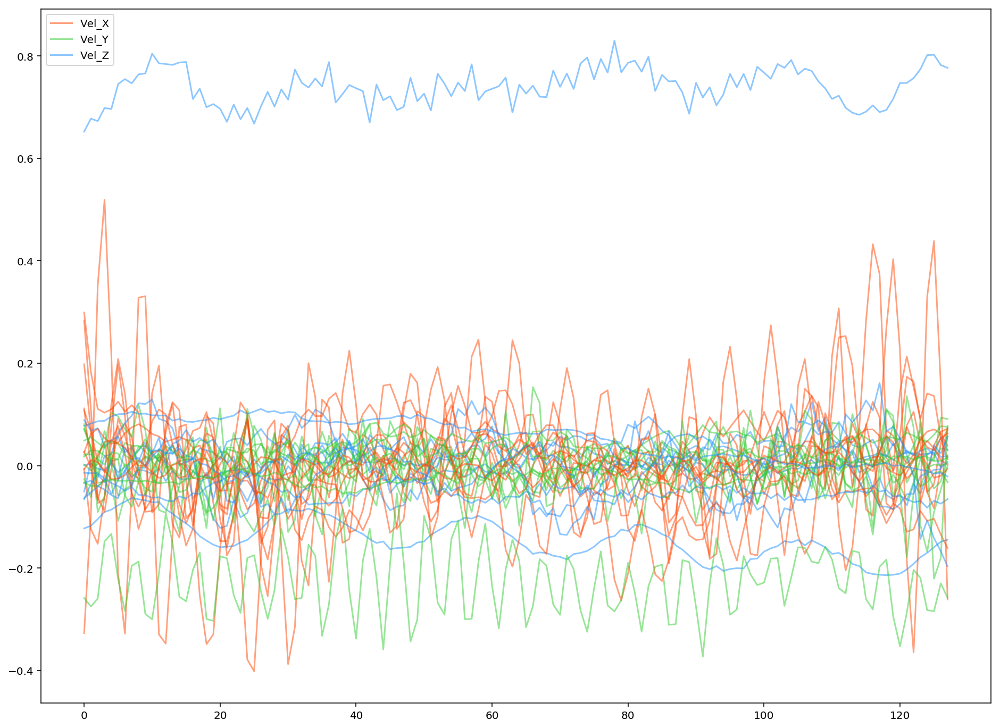

In [166]:
plt.figure(figsize=(16,12));
for i in range(10):
    cdf = x_train[x_train['series_id'] == i].reset_index(drop=True)
    alpha = 0.5
    plt.plot(cdf['angular_velocity_X'], color='orangered', alpha=alpha, label='Vel_X');
    plt.plot(cdf['angular_velocity_Y'], color='limegreen', alpha=alpha, label='Vel_Y');
    plt.plot(cdf['angular_velocity_Z'], color='dodgerblue', alpha=alpha, label='Vel_Z');

# setting the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys());

# Acceleration Variables Plotted for 100 Series

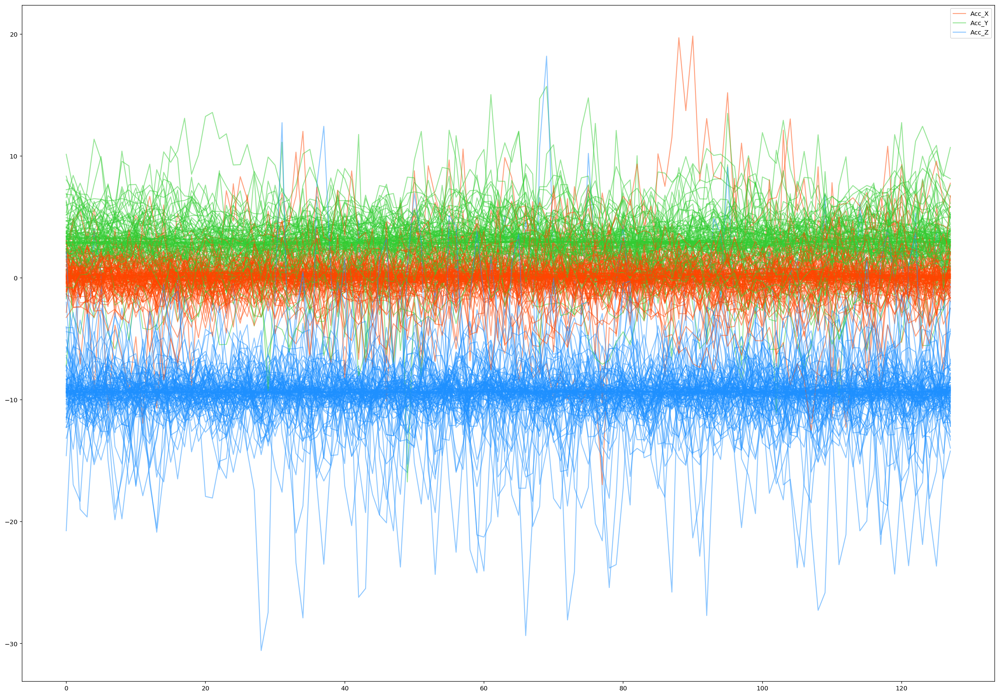

In [167]:
plt.figure(figsize=(28,20));
for i in range(100):
    cdf = x_train[x_train['series_id'] == i].reset_index(drop=True)
    alpha = 0.5
    plt.plot(cdf['linear_acceleration_X'], color='orangered', alpha=alpha, label='Acc_X');
    plt.plot(cdf['linear_acceleration_Y'], color='limegreen', alpha=alpha, label='Acc_Y');
    plt.plot(cdf['linear_acceleration_Z'], color='dodgerblue', alpha=alpha, label='Acc_Z');

# setting the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys());

# Orientation, Velocity, and Accelaration Variables Plotted Together

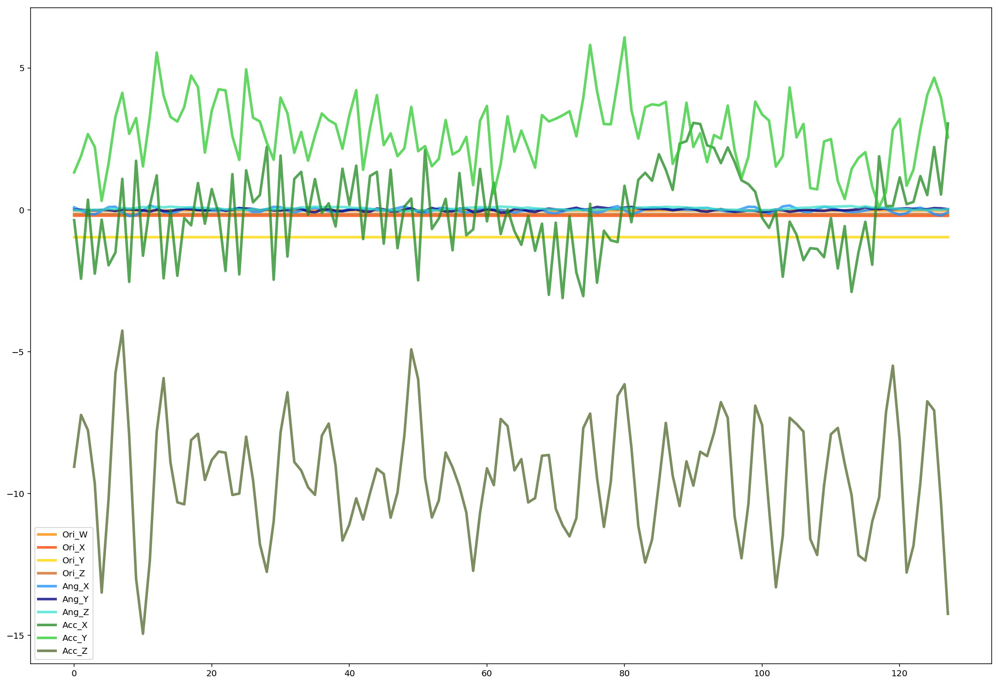

In [171]:
plt.figure(figsize=(20,14));
cdf = x_train[x_train['series_id'] == 200].reset_index(drop=True)
pltkwargs = {'alpha': 0.77, 'linewidth': 3}

plt.plot(cdf['orientation_W'], color='darkorange', label='Ori_W', **pltkwargs);
plt.plot(cdf['orientation_X'], color='orangered', label='Ori_X', **pltkwargs);
plt.plot(cdf['orientation_Y'], color='gold', label='Ori_Y', **pltkwargs);
plt.plot(cdf['orientation_Z'], color='Chocolate', label='Ori_Z', **pltkwargs);

plt.plot(cdf['angular_velocity_X'], color='dodgerblue', label='Ang_X', **pltkwargs);
plt.plot(cdf['angular_velocity_Y'], color='navy', label='Ang_Y', **pltkwargs);
plt.plot(cdf['angular_velocity_Z'], color='Turquoise', label='Ang_Z', **pltkwargs);

plt.plot(cdf['linear_acceleration_X'], color='ForestGreen', label='Acc_X', **pltkwargs);
plt.plot(cdf['linear_acceleration_Y'], color='LimeGreen', label='Acc_Y', **pltkwargs);
plt.plot(cdf['linear_acceleration_Z'], color='DarkOliveGreen', label='Acc_Z', **pltkwargs);

plt.legend();

In [172]:
series_id = 7

# Orientation Variables of a Series

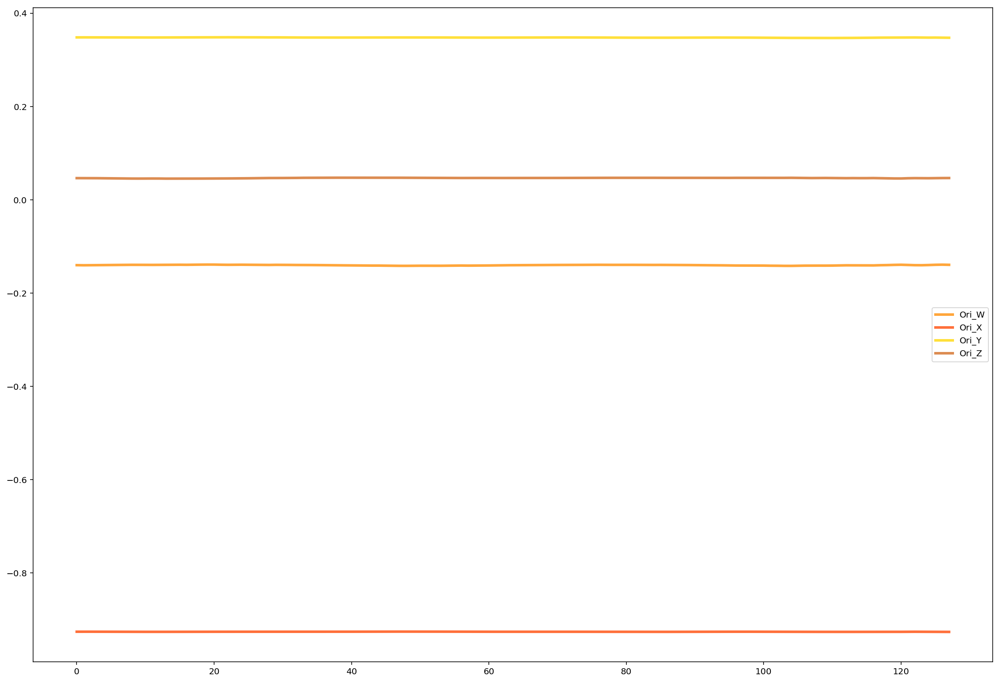

In [173]:
plt.figure(figsize=(20,14));
cdf = x_train[x_train['series_id'] == series_id].reset_index(drop=True)
pltkwargs = {'alpha': 0.77, 'linewidth': 3}

plt.plot(cdf['orientation_W'], color='darkorange', label='Ori_W', **pltkwargs);
plt.plot(cdf['orientation_X'], color='orangered', label='Ori_X', **pltkwargs);
plt.plot(cdf['orientation_Y'], color='gold', label='Ori_Y', **pltkwargs);
plt.plot(cdf['orientation_Z'], color='Chocolate', label='Ori_Z', **pltkwargs);

plt.legend();

# Velocity Variables of a Series

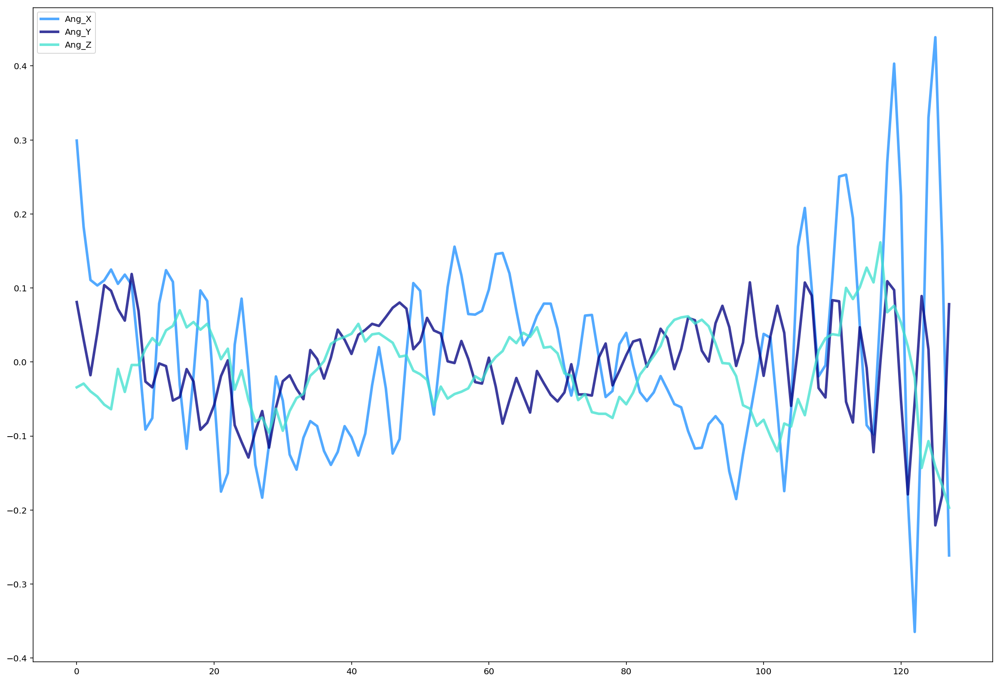

In [174]:
plt.figure(figsize=(20,14));
cdf = x_train[x_train['series_id'] == series_id].reset_index(drop=True)
pltkwargs = {'alpha': 0.77, 'linewidth': 3}

plt.plot(cdf['angular_velocity_X'], color='dodgerblue', label='Ang_X', **pltkwargs);
plt.plot(cdf['angular_velocity_Y'], color='navy', label='Ang_Y', **pltkwargs);
plt.plot(cdf['angular_velocity_Z'], color='Turquoise', label='Ang_Z', **pltkwargs);

plt.legend();

# Acceleration Variables of a Series

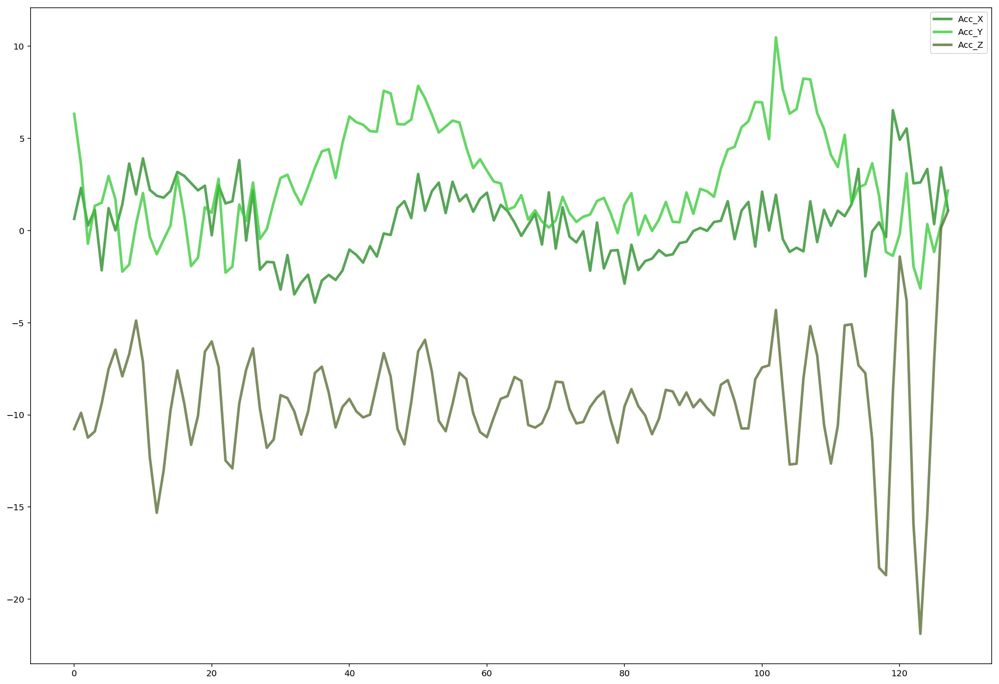

In [175]:
plt.figure(figsize=(20,14));
cdf = x_train[x_train['series_id'] == series_id].reset_index(drop=True)
pltkwargs = {'alpha': 0.77, 'linewidth': 3}

plt.plot(cdf['linear_acceleration_X'], color='ForestGreen', label='Acc_X', **pltkwargs);
plt.plot(cdf['linear_acceleration_Y'], color='LimeGreen', label='Acc_Y', **pltkwargs);
plt.plot(cdf['linear_acceleration_Z'], color='DarkOliveGreen', label='Acc_Z', **pltkwargs);

plt.legend();

# Target Values

In [10]:
surface_types = y_train['surface'].value_counts().index.tolist()
y_train['surface'].value_counts()

concrete                  779
soft_pvc                  732
wood                      607
tiled                     514
fine_concrete             363
hard_tiles_large_space    308
soft_tiles                297
carpet                    189
hard_tiles                 21
Name: surface, dtype: int64

# Plots Based on Target Value

In [17]:
x_train_c = x_train.copy()
id_surface = y_train['surface']
id_surface.index = y_train['series_id']
x_train_c['target'] = x_train_c['series_id'].map(id_surface)
x_train_c.head()

,row_id,series_id,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W,angular_velocity_X,angular_velocity_Y,angular_velocity_Z,linear_acceleration_X,linear_acceleration_Y,linear_acceleration_Z,target
0,0_0,0,0,-0.75853,-0.63435,-0.10488,-0.10597,0.107650,0.017561,0.000767,-0.74857,2.1030,-9.7532,fine_concrete
1,0_1,0,1,-0.75853,-0.63434,-0.10490,-0.10600,0.067851,0.029939,0.003385,0.33995,1.5064,-9.4128,fine_concrete
2,0_2,0,2,-0.75853,-0.63435,-0.10492,-0.10597,0.007275,0.028934,-0.005978,-0.26429,1.5922,-8.7267,fine_concrete
3,0_3,0,3,-0.75852,-0.63436,-0.10495,-0.10597,-0.013053,0.019448,-0.008974,0.42684,1.0993,-10.0960,fine_concrete
4,0_4,0,4,-0.75852,-0.63435,-0.10495,-0.10596,0.005135,0.007652,0.005245,-0.50969,1.4689,-10.4410,fine_concrete


In [20]:
grouped = x_train_c.groupby('target')

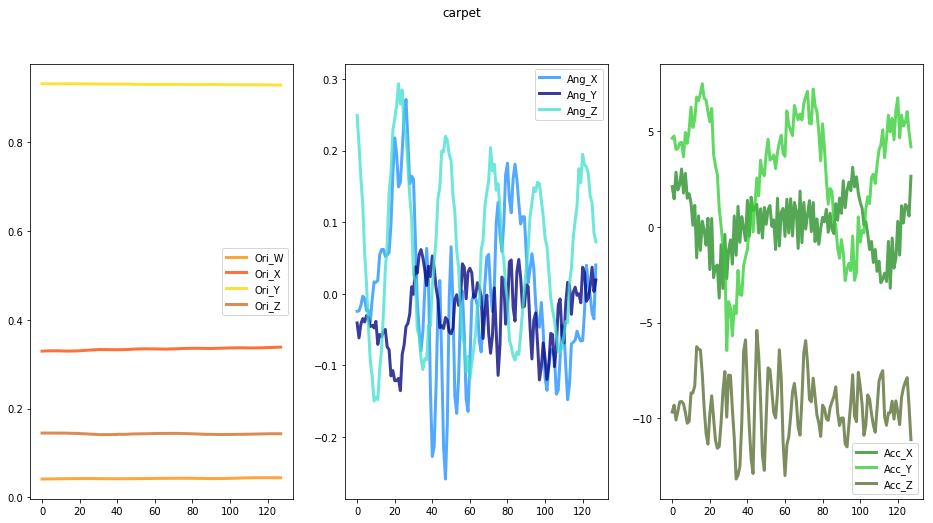

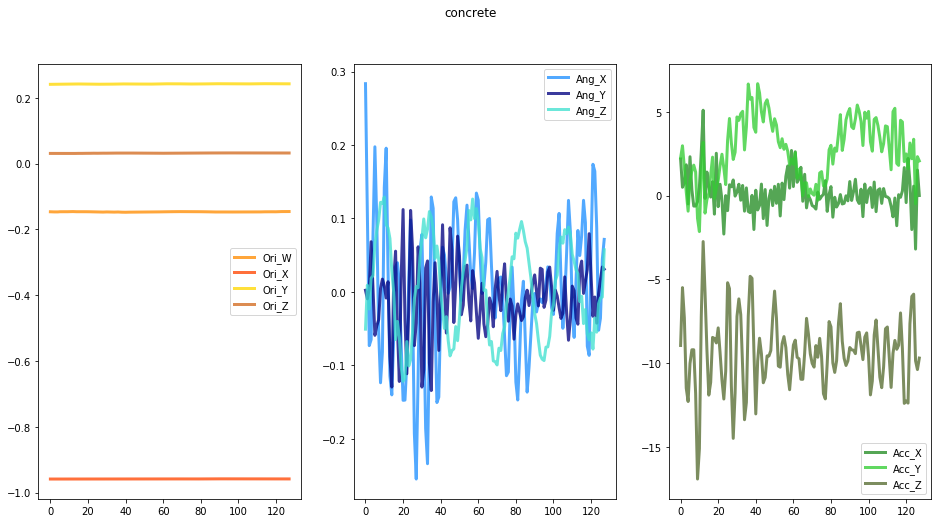

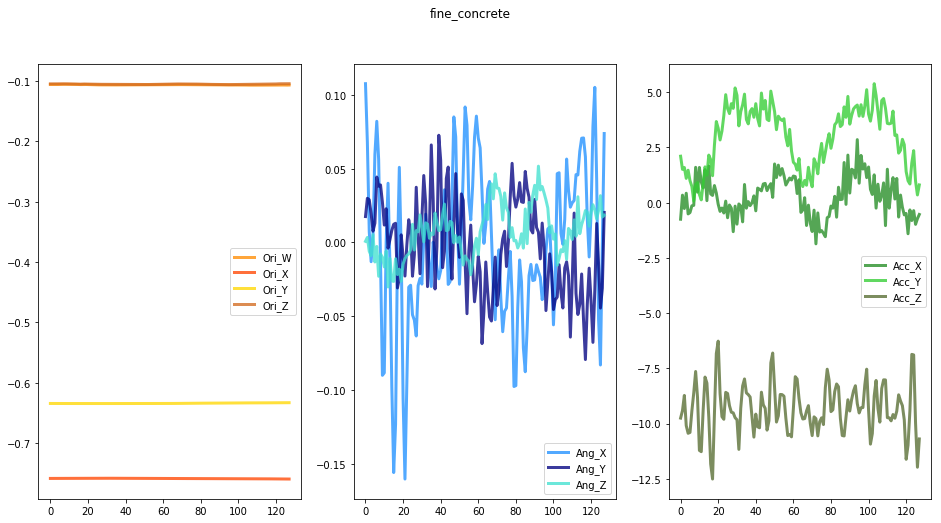

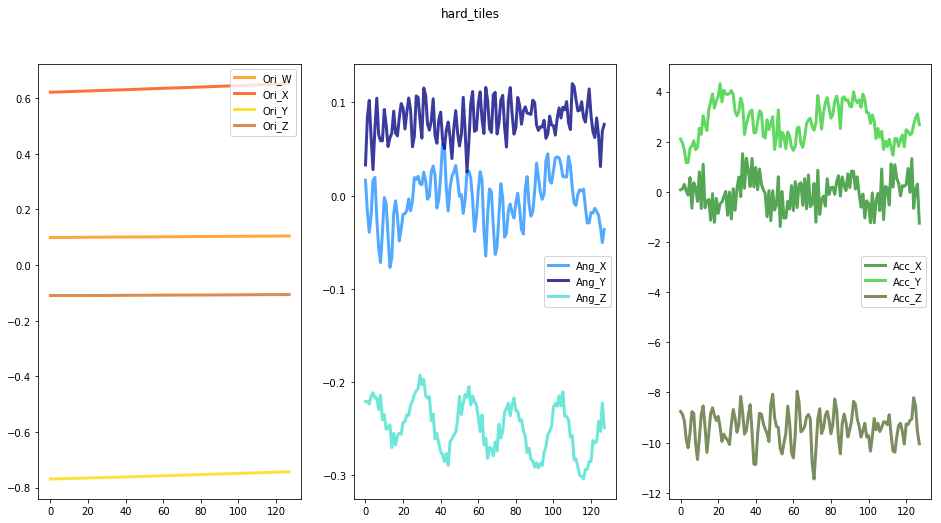

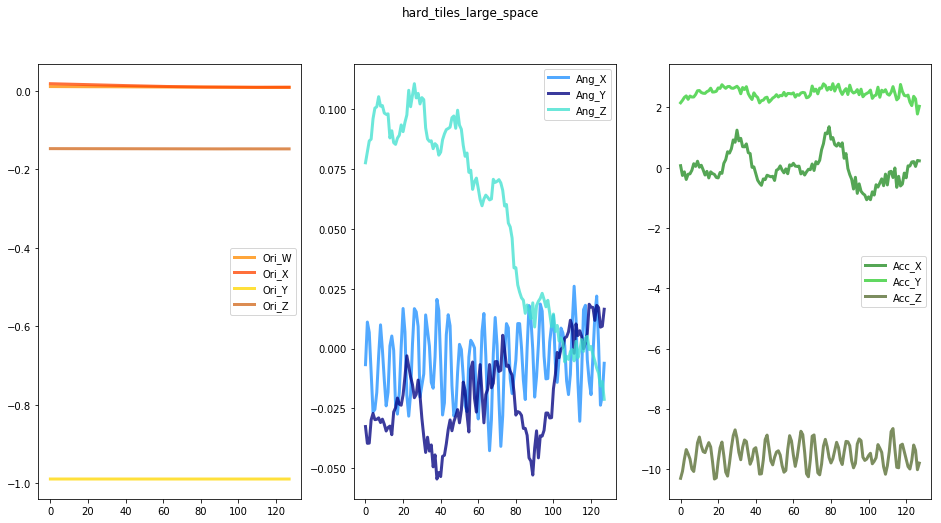

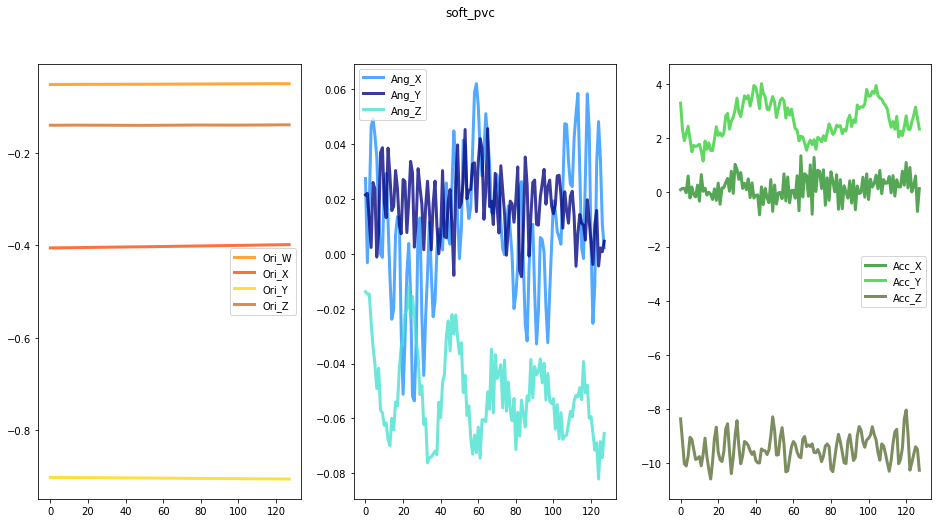

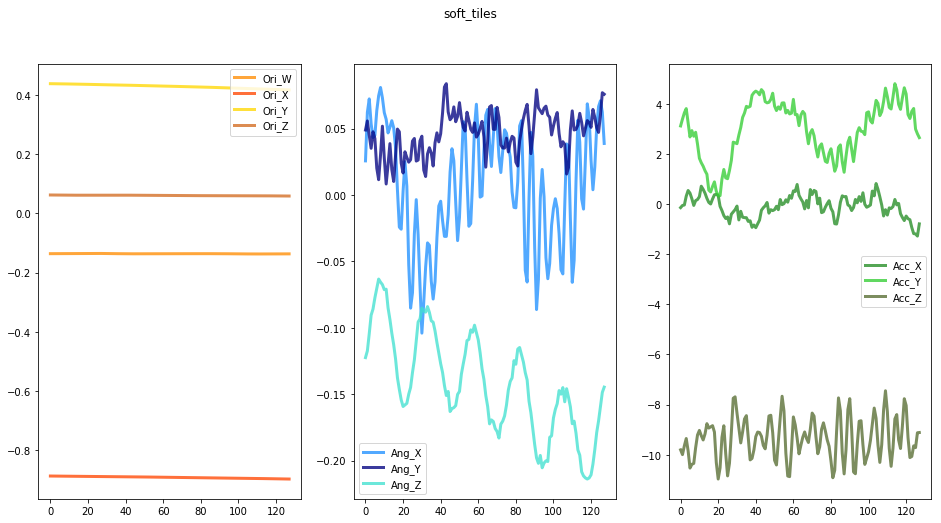

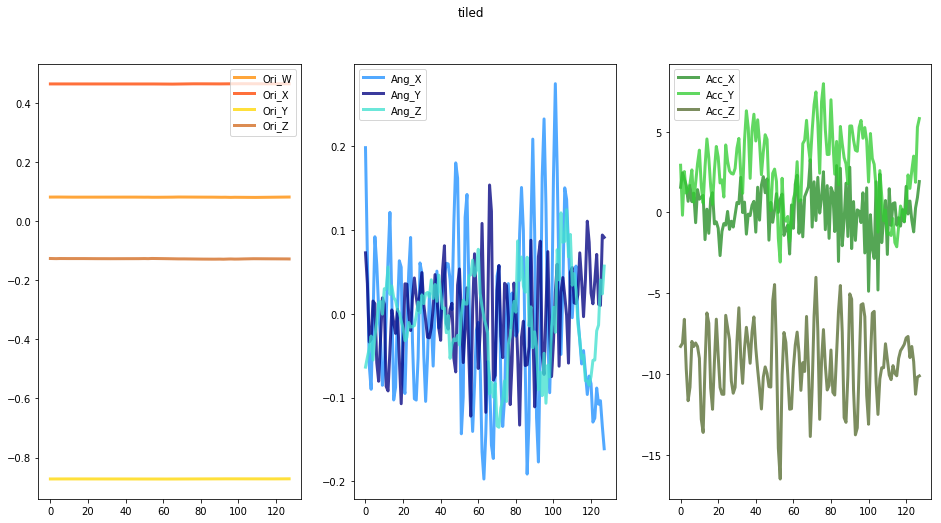

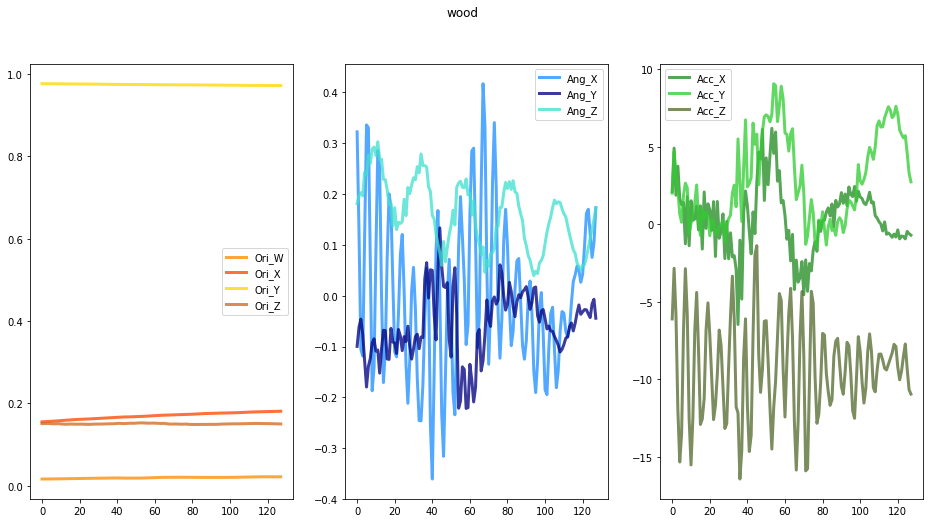

In [33]:
for name, group in grouped:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 8));
    fig.suptitle(name)
    cdf = group[group['series_id'] == group['series_id'].iloc[0]].reset_index(drop=True)
    pltkwargs = {'alpha': 0.77, 'linewidth': 3}
    axes[0].plot(cdf['orientation_W'], color='darkorange', label='Ori_W', **pltkwargs);
    axes[0].plot(cdf['orientation_X'], color='orangered', label='Ori_X', **pltkwargs);
    axes[0].plot(cdf['orientation_Y'], color='gold', label='Ori_Y', **pltkwargs);
    axes[0].plot(cdf['orientation_Z'], color='Chocolate', label='Ori_Z', **pltkwargs);
    axes[0].legend()
    
    axes[1].plot(cdf['angular_velocity_X'], color='dodgerblue', label='Ang_X', **pltkwargs);
    axes[1].plot(cdf['angular_velocity_Y'], color='navy', label='Ang_Y', **pltkwargs);
    axes[1].plot(cdf['angular_velocity_Z'], color='Turquoise', label='Ang_Z', **pltkwargs);
    axes[1].legend()
    
    axes[2].plot(cdf['linear_acceleration_X'], color='ForestGreen', label='Acc_X', **pltkwargs);
    axes[2].plot(cdf['linear_acceleration_Y'], color='LimeGreen', label='Acc_Y', **pltkwargs);
    axes[2].plot(cdf['linear_acceleration_Z'], color='DarkOliveGreen', label='Acc_Z', **pltkwargs);
    axes[2].legend()
    